# Lights, Camera, Data: A Deep Dive into OTT Platform Performance

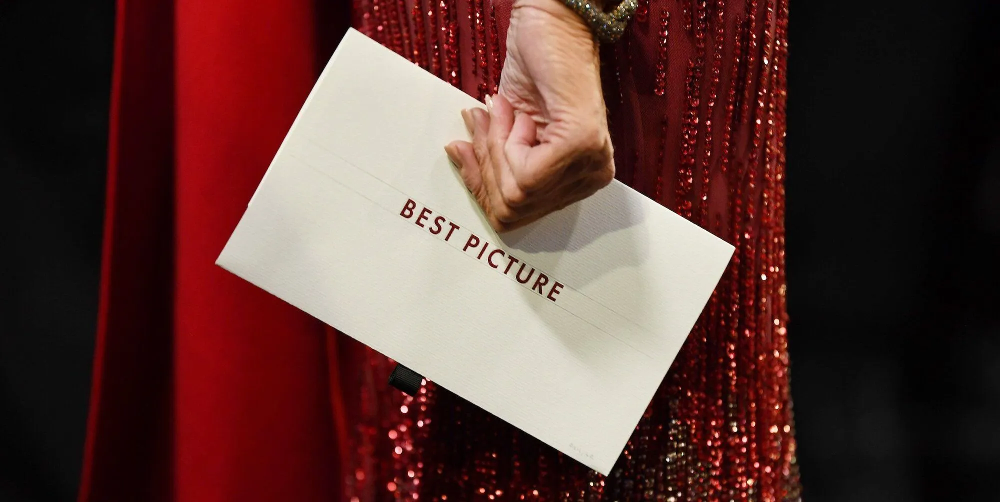

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
amazon_credits = pd.read_csv('amazon_credits.csv')
amazon_titles = pd.read_csv('amazon_titles.csv')
apple_credits = pd.read_csv('apple_credits.csv')
apple_titles = pd.read_csv('apple_titles.csv')
disney_credits = pd.read_csv('disney_credits.csv')
disney_titles = pd.read_csv('disney_titles.csv')
hbo_credits = pd.read_csv('hbo_credits.csv')
hbo_titles = pd.read_csv('hbo_titles.csv')
netflix_credits = pd.read_csv('netflix_credits.csv')
netflix_titles = pd.read_csv('netflix_titles.csv')
paramount_credits = pd.read_csv('paramount_credits.csv')
paramount_titles = pd.read_csv('paramount_titles.csv')

In [3]:
ott_content = pd.concat([amazon_titles,apple_titles,disney_titles,hbo_titles,netflix_titles,paramount_titles], axis = 0)

In [4]:
ott_content.head(3)

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,tm87233,It's a Wonderful Life,MOVIE,A holiday favourite for generations... George...,1946,PG,130,"['drama', 'family', 'fantasy', 'romance', 'com...",['US'],NaN,tt0038650,8.6,467766.0,27.611,8.261
1,tm143047,Duck Soup,MOVIE,Rufus T. Firefly is named president/dictator o...,1933,NaN,69,"['comedy', 'war']",['US'],NaN,tt0023969,7.8,60933.0,9.013,7.357
2,tm83884,His Girl Friday,MOVIE,"Hildy, the journalist former wife of newspaper...",1940,NaN,92,"['drama', 'romance', 'comedy']",['US'],NaN,tt0032599,7.8,60244.0,14.759,7.433


In [5]:
ott_content[ott_content.duplicated()].shape

(1884, 15)

In [6]:
ott_content = ott_content.drop_duplicates()

In [7]:
# handling missing values 
def null_rate_fn(ott_content):
    for i in ott_content.columns: 
        null_rate = ott_content[i].isna().sum()/len(ott_content) *100
        if null_rate > 0:
            print("{} null rate is {}%".format(i,round(null_rate,2)))

In [8]:
null_rate_fn(ott_content)

description null rate is 0.83%
age_certification null rate is 51.28%
seasons null rate is 75.93%
imdb_id null rate is 8.35%
imdb_score null rate is 10.95%
imdb_votes null rate is 11.21%
tmdb_popularity null rate is 3.08%
tmdb_score null rate is 12.84%


In [9]:
len(ott_content.loc[ott_content['seasons'].isna() & (ott_content['type'] == 'MOVIE')]) == ott_content.seasons.isna().sum()

True

In [10]:
ott_content.seasons.fillna(0, inplace = True)

In [11]:
ott_content.genres.value_counts()

['documentation']                                                  1879
['comedy']                                                         1726
['drama']                                                          1593
['drama', 'romance']                                                431
['drama', 'comedy']                                                 383
                                                                   ... 
['comedy', 'romance', 'drama', 'fantasy']                             1
['drama', 'war', 'action', 'history']                                 1
['drama', 'sport', 'crime']                                           1
['crime', 'comedy', 'romance']                                        1
['action', 'fantasy', 'comedy', 'drama', 'romance', 'thriller']       1
Name: genres, Length: 4485, dtype: int64

In [12]:
ott_content['genres'] = ott_content['genres'].str.replace(r'[','').str.replace(r"'","").str.replace(r']','')

/var/folders/kd/vczjh0f55158sc6lflbyfd4w0000gn/T/ipykernel_53880/1289134207.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  ott_content['genres'] = ott_content['genres'].str.replace(r'[','').str.replace(r"'","").str.replace(r']','')


In [13]:
ott_content['production_countries'] = ott_content['production_countries'].str.replace(r'[','').str.replace(r"'","").str.replace(r']','')

/var/folders/kd/vczjh0f55158sc6lflbyfd4w0000gn/T/ipykernel_53880/1437281083.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  ott_content['production_countries'] = ott_content['production_countries'].str.replace(r'[','').str.replace(r"'","").str.replace(r']','')


In [14]:
ott_content['genre'] = ott_content['genres'].apply(lambda x: x.split(',')[0])

In [15]:
ott_content['production_country'] = ott_content['production_countries'].apply(lambda x: x.split(',')[0])

In [16]:
ott_content.drop(columns = ['imdb_id','genres','production_countries'], inplace = True, axis = 1)

In [17]:
lt = []

for i in ott_content['id']:
    platform = []
    if i in amazon_titles['id'].values:
        platform.append('amazon_prime_video')
    if i in apple_titles['id'].values:
        platform.append('apple_tv')
    if i in disney_titles['id'].values:
        platform.append('disney+')
    if i in hbo_titles['id'].values:
        platform.append('hbo_max')
    if i in netflix_titles['id'].values:
        platform.append('netflix')
    if i in paramount_titles['id'].values:
        platform.append('paramount+')
    lt.append(platform)

In [18]:
ott_content['streaming_platform'] = lt

In [19]:
ott_content['title'] = ott_content['title'].astype('str')

In [20]:
title_corpus = ' '.join(ott_content['title'])

In [21]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image #to load our image

In [22]:
# text = open('batman.txt', 'r').read()
stopwords = set(STOPWORDS)

In [23]:
# Define a function to specify the text color
def white_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "rgb(255, 255, 255)"

custom_mask = np.array(Image.open('batman.png')) 
wc = WordCloud(background_color = 'black',
               stopwords = stopwords,
               mask = custom_mask,height = 2000, width = 4000, color_func=white_color_func)

wc.generate(title_corpus)

##  Could be possible that certain words appear more frequently in movie titles, and are considered more powerful or appropriate for a title? 

By analyzing the frequency of words, we can also identify whether certain words are more commonly used in titles, and gain insights into any patterns or trends in the data. 

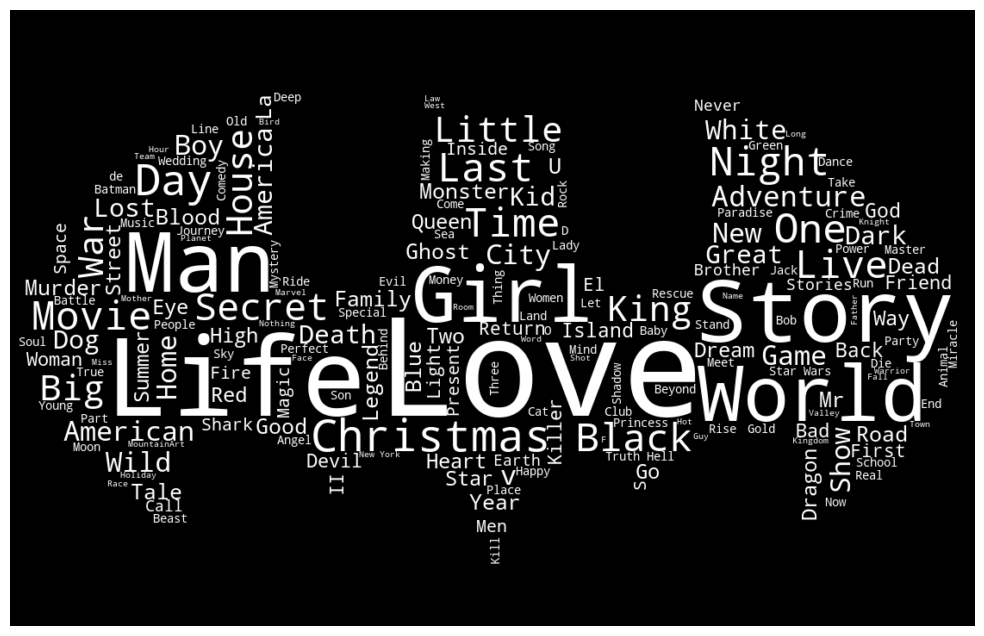

In [24]:
plt.figure(figsize=(16,8))
plt.imshow(wc, interpolation = 'bilinear')
plt.axis('off')
plt.show()

In [25]:
ott_content['description'] = ott_content['description'].astype('str')

In [26]:
description_corpus = ' '.join(ott_content['description'])

In [27]:
def red_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "rgb(255, 0, 0)"

custom_mask = np.array(Image.open('wonderwoman.jpg')) 
wc = WordCloud(background_color = 'black',
               stopwords = stopwords,
               mask = custom_mask,height = 2000, width = 4000, color_func=red_color_func)

wc.generate(description_corpus)

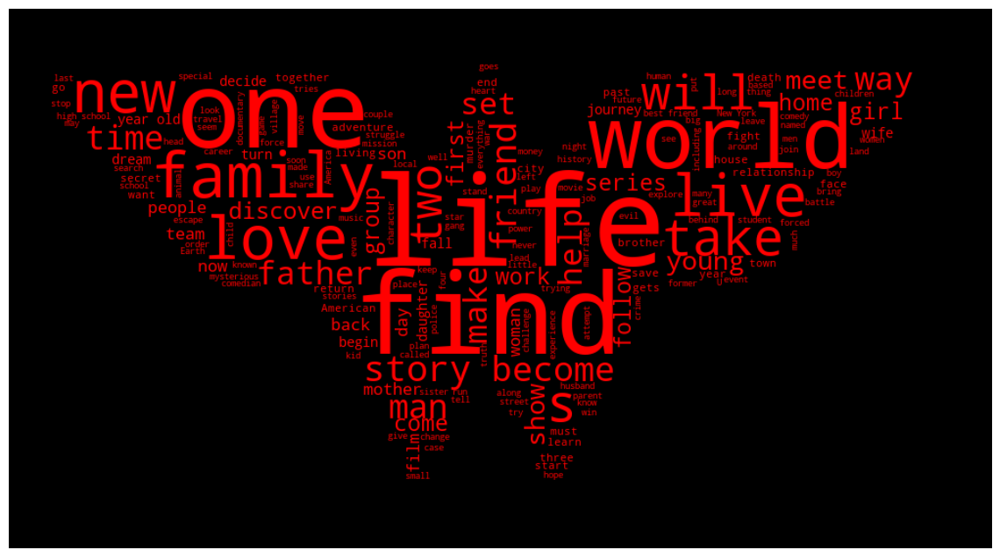

In [28]:
plt.figure(figsize=(16,8))
plt.imshow(wc, interpolation = 'bilinear')
plt.axis('off')
plt.show()

In [29]:
# Filter out rows where the release_year column is less than 1980
df = ott_content[ott_content['release_year'] > 1980]

# Group the data by year and type of content and count the number of movies/shows in each year for each content type
yearly_count = df.groupby(['release_year', 'type'])['title'].count().reset_index()

# Create a new dataframe with the year, type of content, and the cumulative sum of movies/shows for each year for each content type
yearly_cumulative_sum = pd.DataFrame(yearly_count)
yearly_cumulative_sum['cumulative_sum'] = yearly_cumulative_sum.groupby('type')['title'].cumsum()

In [30]:
# Create a line chart using Plotly with the year on the x-axis, the cumulative sum of movies/shows on the y-axis, and the type of content as the category
fig = px.area(yearly_cumulative_sum, x='release_year', y='cumulative_sum', color='type', title='Year-on-Year Trend for Type of Content Released')
fig.update_layout(xaxis_title='Years', yaxis_title='Cumulative sum', legend_title='Type of Content')
fig.show()

In [31]:
# Filter out rows where the release_year column is less than 1980
df = ott_content[ott_content['release_year'] > 1980]
df = df[df['type']=='MOVIE']
# Group the data by genre and calculate the total runtime for each genre
genre_runtime = df.groupby('genre')['runtime'].mean().reset_index()

# Sort the genres by total runtime in descending order and select the top 10 genres
top_genres = genre_runtime.sort_values('runtime', ascending=False).head(10)['genre']

# Filter the original dataframe to include only rows with the top 10 genres
df = df[df['genre'].isin(top_genres)]

# Group the data by year and genre, and calculate the average runtime for each year and genre
yearly_runtime = df.groupby(['release_year', 'genre'])['runtime'].mean().reset_index()

# Create a bar chart using Plotly with the year on the x-axis, the average runtime on the y-axis, and the genre as the category
fig = px.bar(yearly_runtime, x='release_year', y='runtime', color='genre', title='Year-on-Year Trend of Movie Runtime for Top 10 Genres')
fig.update_layout(xaxis_title='Years', yaxis_title='Average Runtime(mins)', legend_title='Genre')
fig.show()

In [32]:
# Filter out rows where the release_year column is less than 1980
df = ott_content[ott_content['release_year'] > 1980]
seasons = df[df['type']=='SHOW']
# Group the data by genre and calculate the total runtime for each genre
genre_runtime = seasons.groupby('genre')['seasons'].mean().reset_index()

# Sort the genres by total runtime in descending order and select the top 10 genres
top_genres = genre_runtime.sort_values('seasons', ascending=False).head(10)['genre']

# Filter the original dataframe to include only rows with the top 10 genres
seasons = seasons[seasons['genre'].isin(top_genres)]

# Group the data by year and genre, and calculate the average runtime for each year and genre
yearly_runtime = seasons.groupby(['release_year', 'genre'])['seasons'].mean().reset_index()

# Create a bar chart using Plotly with the year on the x-axis, the average runtime on the y-axis, and the genre as the category
fig = px.bar(yearly_runtime, x='release_year', y='seasons', color='genre', title='Year-on-Year Trend of Average Number of Seasons in a Show for Top 10 Genres')
fig.update_layout(xaxis_title='Years', yaxis_title='Average No.of Seasons', legend_title='Genre')
fig.show()

In [33]:
ott_content_filtered = ott_content
# Convert the "streaming_platform" and "genre" columns to string datatype
ott_content_filtered['streaming_platform'] = ott_content_filtered['streaming_platform'].astype(str)
ott_content_filtered['genre'] = ott_content_filtered['genre'].astype(str)

# Define a list of streaming platforms to filter out
streaming_platforms_to_filter = ['amazon_prime_video', 'apple_tv', 'disney+','netflix','hbo_max','paramount+']

# Filter out rows that have the specified streaming platforms
ott_content_filtered = ott_content.loc[~ott_content['streaming_platform'].isin(streaming_platforms_to_filter)]

# Group the data based on the streaming platform and the genre, and calculate the count of movies or TV shows in each group
grouped_data = ott_content_filtered.groupby(['streaming_platform', 'genre']).size().reset_index(name='count')

# Create a new dataframe that shows the streaming platform, genre, and count of movies or TV shows for each group
platform_genre_count = grouped_data.groupby(['streaming_platform', 'genre'])['count'].sum().reset_index()

# Create a sunburst chart that shows the streaming platform on the outer ring, the genre on the inner ring, and the count of movies or TV shows as the size of the segments
fig = px.sunburst(platform_genre_count, path=['streaming_platform', 'genre'], values='count', 
                  title='Streaming Platforms and their Genres', 
                  color='count',
                  color_continuous_scale='RdBu',
                  hover_data=['count'],
                  labels={'count':'Number of Titles'})
fig.show()

In [34]:
# Drop the rows where the "production_country" is an empty list
ott_content = ott_content[ott_content['production_country'] != '']

# Reset the index of the dataframe
ott_content.reset_index(drop=True, inplace=True)

# Get the value counts for the "production_country" column and select the top 10
top_countries = ott_content['production_country'].value_counts().nlargest(10)

# Create a bar chart of the top production countries using plotly
fig = px.bar(x=top_countries.index, y=top_countries.values, 
             labels={'x': 'Country', 'y': 'Number of Titles'},
             title='Top 10 Production Countries')

# Show the plot
fig.show()

In [69]:
# Create a histogram of "tomb_popularity" values using Plotly
fig = px.histogram(ott_content, x='tmdb_score', nbins=20, color = 'type')

# Set the title and axis labels
fig.update_layout(title={
                'font': {'size': 22},
                    'x': 0.5,
                    'y': 0.95 ,
                 'text':'Distribution of TMDB Score'},
                  xaxis_title='TMDB Score',
                  yaxis_title='Frequency', bargap=0.05)

# Display the plot
fig.show()

In [68]:
# Create a histogram of "tomb_popularity" values using Plotly
fig = px.histogram(ott_content, x='imdb_score', nbins=20, color = 'type')

# Set the title and axis labels
fig.update_layout(title={
                'font': {'size': 22},
                    'x': 0.5,
                    'y': 0.95 ,
                 'text':'Distribution of IMDB Score'},
                  xaxis_title='IMDB Score',
                  yaxis_title='Frequency', bargap=0.05)

# Display the plot
fig.show()

In [37]:
ratings_df = ott_content.dropna(subset=['age_certification'])
top_platforms = ratings_df.groupby('streaming_platform')['title'].count().sort_values(ascending=False).head(5).index.tolist()
ratings_top = ratings_df[ratings_df['streaming_platform'].isin(top_platforms)]
rating_platform_counts = ratings_top.groupby(['age_certification', 'streaming_platform'])['title'].count().unstack().fillna(0)
rating_platform_counts['total'] = rating_platform_counts.sum(axis=1)
rating_platform_counts.sort_values('total', ascending=False, inplace=True)

In [89]:
import plotly.graph_objs as go

fig = go.Figure(data=[go.Bar(x=rating_platform_counts.index, y=rating_platform_counts[platform], name=platform) for platform in rating_platform_counts.columns[:-1]])

fig.update_layout(title={
                    'text': 'Distribution of Content according to Age Certification across Top 5 Streaming Platforms',
                    'font': {'size': 22},
                    'x': 0.5,
                    'y': 0.95 
                    },
                  xaxis_title='Age Certification',
                  yaxis_title='Number of Titles', legend_title = 'Top 5 Streaming Platforms',
                  barmode='stack')

fig.show()

In [71]:
import plotly.graph_objs as go

# Assuming your dataframe is named ott_content
# filtered_df = ott_content[~ott_content['production_country'].str.contains('United States')]

filtered_df = ott_content[ott_content['production_country'] != 'US']

top_countries = filtered_df.groupby(['production_country', 'streaming_platform'])['title'].count().reset_index()
top_countries_pivot = top_countries.pivot_table(index='production_country', columns='streaming_platform', values='title')
top_countries_pivot = top_countries_pivot[top_countries_pivot.sum().sort_values(ascending=False).index[:5]]
top_countries_pivot = top_countries_pivot.loc[top_countries_pivot.sum(axis=1).sort_values(ascending=False).index[:5]]

# Create the heatmap trace
heatmap = go.Heatmap(
    z=top_countries_pivot.values.tolist(),
    x=top_countries_pivot.columns.tolist(),
    y=top_countries_pivot.index.tolist(),
    colorscale='Blues'
)


layout = go.Layout(
    title={
        'text': "Top 5 countries contributing to top 5 streaming platforms (excluding US)",
        'font': {'size': 24},
        'x': 0.5,
        'y': 0.95
    },
    xaxis_title="Streaming Platform",
    yaxis_title="Count of Content Produced",
    legend_title="Country"
)



# Create the figure and plot it
fig = go.Figure(data=[heatmap], layout=layout)
fig.show()

In [40]:
# Get the top 5 production countries and genres
top_countries = ott_content['production_country'].value_counts().head(5).index.tolist()
top_genres = ott_content['genre'].value_counts().head(5).index.tolist()

# Subset the data to include only the top 5 countries and genres
subset_df = ott_content[ott_content['production_country'].isin(top_countries) & ott_content['genre'].isin(top_genres)]

# Group the data by country and genre, and get the count of each combination
grouped_data = subset_df.groupby(['production_country', 'genre']).size().reset_index(name='count')

# Create a grouped bar chart using Plotly
fig = px.bar(grouped_data, x='production_country', y='count', color='genre', barmode='group')


# Update the chart layout
fig.update_layout(
    title={
        'text': "Top 5 Production Countries and Genres",
        'font': {'size': 28},
        'x': 0.5,
        'y': 0.95
    },
    xaxis_title="Production Country",
    yaxis_title="Count of Content Produced",
    legend_title="Genre"
)


# Show the chart
fig.show()

In [41]:
# Get the top 5 production countries
top_countries = ott_content['production_country'].value_counts().head(5).index.tolist()

# Subset the data to include only the top 5 countries
subset_df = ott_content[ott_content['production_country'].isin(top_countries)]

# Group the data by country and content type, and get the count of each combination
grouped_data = subset_df.groupby(['production_country', 'type']).size().reset_index(name='count')

# Sort the data by count in descending order
grouped_data = grouped_data.sort_values(['count','production_country'], ascending=[False, True])

# Create a horizontal stacked bar chart using Plotly
fig = px.bar(grouped_data, y='production_country', x='count', color='type', barmode='stack',
             orientation='h', height=500, width=800)

# Update the chart layout
fig.update_layout(
    title={
        'text': "Top 5 Production Countries and Type of Content watched",
        'font': {'size': 28},
        'x': 0.5,
        'y': 0.95
    },
    xaxis_title="Count",
    yaxis_title="Production Country",
    legend_title="Content Type"
)

# Show the chart
fig.show()

In [42]:
ott_credits = pd.concat([amazon_credits,apple_credits,disney_credits,hbo_credits,netflix_credits,paramount_credits], axis = 0)

In [43]:
ott_credits.drop(columns = ['person_id'], axis = 1, inplace = True)

In [44]:
ott_df = ott_content.copy()
ott_df = ott_df.merge(ott_credits, on = 'id')

In [45]:
ott_df.head(2)

,id,title,type,description,release_year,age_certification,runtime,seasons,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,genre,production_country,streaming_platform,name,character,role
0,tm87233,It's a Wonderful Life,MOVIE,A holiday favourite for generations... George...,1946,PG,130,0.0,8.6,467766.0,27.611,8.261,drama,US,['amazon_prime_video'],James Stewart,George Bailey,ACTOR
1,tm87233,It's a Wonderful Life,MOVIE,A holiday favourite for generations... George...,1946,PG,130,0.0,8.6,467766.0,27.611,8.261,drama,US,['amazon_prime_video'],Donna Reed,Mary Hatch,ACTOR


In [46]:
null_rate_fn(ott_df)

age_certification null rate is 40.8%
imdb_score null rate is 4.58%
imdb_votes null rate is 4.7%
tmdb_popularity null rate is 0.01%
tmdb_score null rate is 3.45%
character null rate is 10.14%


In [47]:
ott_df = ott_df.dropna(subset = ['imdb_score', 'imdb_votes','character'])

In [48]:
null_rate_fn(ott_df)

age_certification null rate is 38.08%
tmdb_score null rate is 2.56%


In [49]:
ott_df[ott_df.duplicated()].shape

(31914, 18)

In [50]:
ott_df = ott_df.drop_duplicates()

In [51]:
ott_df[ott_df.duplicated()].shape

(0, 18)

In [52]:
ott_df.imdb_votes.describe().round(2)

count     284510.00
mean       79131.63
std       209052.93
min            5.00
25%         1042.00
50%         7262.00
75%        54238.00
max      2684317.00
Name: imdb_votes, dtype: float64

In [53]:
ott_content.head(2)

,id,title,type,description,release_year,age_certification,runtime,seasons,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,genre,production_country,streaming_platform
0,tm87233,It's a Wonderful Life,MOVIE,A holiday favourite for generations... George...,1946,PG,130,0.0,8.6,467766.0,27.611,8.261,drama,US,['amazon_prime_video']
1,tm143047,Duck Soup,MOVIE,Rufus T. Firefly is named president/dictator o...,1933,NaN,69,0.0,7.8,60933.0,9.013,7.357,comedy,US,['amazon_prime_video']


In [54]:
ott_content.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22313 entries, 0 to 22312
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id                  22313 non-null  object 
 1   title               22313 non-null  object 
 2   type                22313 non-null  object 
 3   description         22313 non-null  object 
 4   release_year        22313 non-null  int64  
 5   age_certification   11216 non-null  object 
 6   runtime             22313 non-null  int64  
 7   seasons             22313 non-null  float64
 8   imdb_score          20266 non-null  float64
 9   imdb_votes          20214 non-null  float64
 10  tmdb_popularity     21890 non-null  float64
 11  tmdb_score          19976 non-null  float64
 12  genre               22313 non-null  object 
 13  production_country  22313 non-null  object 
 14  streaming_platform  22313 non-null  object 
dtypes: float64(5), int64(2), object(8)
memory usage: 2.6+

In [55]:
ott_credits.head(2)

,id,name,character,role
0,tm87233,James Stewart,George Bailey,ACTOR
1,tm87233,Donna Reed,Mary Hatch,ACTOR


In [56]:
ott_credits.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 370546 entries, 0 to 51194
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   id         370546 non-null  object
 1   name       370546 non-null  object
 2   character  332144 non-null  object
 3   role       370546 non-null  object
dtypes: object(4)
memory usage: 14.1+ MB


In [57]:
ott_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 284510 entries, 0 to 367355
Data columns (total 18 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   id                  284510 non-null  object 
 1   title               284510 non-null  object 
 2   type                284510 non-null  object 
 3   description         284510 non-null  object 
 4   release_year        284510 non-null  int64  
 5   age_certification   180847 non-null  object 
 6   runtime             284510 non-null  int64  
 7   seasons             284510 non-null  float64
 8   imdb_score          284510 non-null  float64
 9   imdb_votes          284510 non-null  float64
 10  tmdb_popularity     284510 non-null  float64
 11  tmdb_score          277728 non-null  float64
 12  genre               284510 non-null  object 
 13  production_country  284510 non-null  object 
 14  streaming_platform  284510 non-null  object 
 15  name                284510 non-nul

In [58]:
ott_df.head(2)

,id,title,type,description,release_year,age_certification,runtime,seasons,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,genre,production_country,streaming_platform,name,character,role
0,tm87233,It's a Wonderful Life,MOVIE,A holiday favourite for generations... George...,1946,PG,130,0.0,8.6,467766.0,27.611,8.261,drama,US,['amazon_prime_video'],James Stewart,George Bailey,ACTOR
1,tm87233,It's a Wonderful Life,MOVIE,A holiday favourite for generations... George...,1946,PG,130,0.0,8.6,467766.0,27.611,8.261,drama,US,['amazon_prime_video'],Donna Reed,Mary Hatch,ACTOR


In [59]:
ott_df['role'].unique()

array(['ACTOR'], dtype=object)

In [60]:
ott_df['name'] = ott_df['name'].astype(str)

In [61]:
actor_name_corpus = ' '.join(ott_df['name'])

In [62]:
def yellow_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return "rgb(255, 255, 0)"

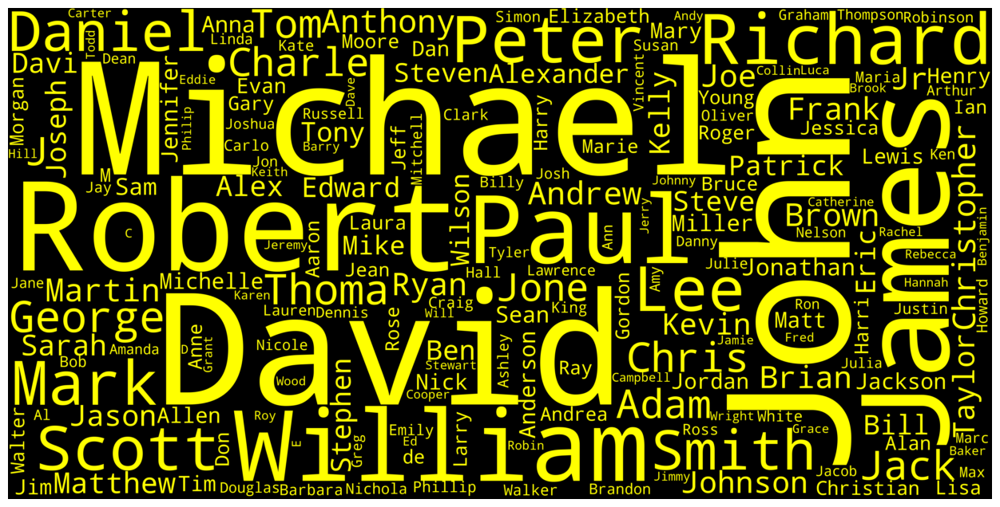

In [63]:
# custom_mask = np.array(Image.open('batman.png')) 
wc = WordCloud(background_color = 'black',
               stopwords = stopwords,
               height = 2000, width = 4000, color_func= yellow_color_func)

wc.generate(actor_name_corpus)

plt.figure(figsize=(16,8))
plt.imshow(wc, interpolation = 'bilinear')
plt.axis('off')
plt.show()

In [64]:
ott_df.columns

Index(['id', 'title', 'type', 'description', 'release_year',
       'age_certification', 'runtime', 'seasons', 'imdb_score', 'imdb_votes',
       'tmdb_popularity', 'tmdb_score', 'genre', 'production_country',
       'streaming_platform', 'name', 'character', 'role'],
      dtype='object')

In [75]:
fig = px.scatter(ott_df, x = 'imdb_score', y = 'tmdb_score', color = 'type')
fig.update_layout(title = 'Relationship between IMDB score and TMDB score', 
                  title_x =0.5, xaxis_title = 'IMDB Score', 
                  yaxis_title = 'TMDB Score', 
                 legend_title = 'Type')
fig.show()

In [66]:
ott_df.corr()

/var/folders/kd/vczjh0f55158sc6lflbyfd4w0000gn/T/ipykernel_53880/2458036775.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,release_year,runtime,seasons,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
release_year,1.000000,0.017482,0.059962,-0.063146,0.028928,0.115110,0.064342
runtime,0.017482,1.000000,-0.377978,0.126860,0.300288,0.068246,0.086700
seasons,0.059962,-0.377978,1.000000,0.149177,-0.032019,0.123103,0.164570
imdb_score,-0.063146,0.126860,0.149177,1.000000,0.343245,0.110564,0.717659
imdb_votes,0.028928,0.300288,-0.032019,0.343245,1.000000,0.242024,0.286904
tmdb_popularity,0.115110,0.068246,0.123103,0.110564,0.242024,1.000000,0.170783
tmdb_score,0.064342,0.086700,0.164570,0.717659,0.286904,0.170783,1.000000


In [84]:
import plotly.express as px

# Filter the dataframe to include only movies
movies_df = df[df['type'] == 'MOVIE']

# Group the data by age_certification and calculate the average runtime for each age certification
runtime_by_certification = movies_df.groupby('age_certification')['runtime'].mean().reset_index()

# Create a bar chart using Plotly with the age_certification on the x-axis and the average runtime on the y-axis
fig = px.bar(runtime_by_certification, x='age_certification', y='runtime', color = 'age_certification',
             title='Average Runtime of Movies by Age Certification')
fig.update_layout(xaxis_title='Age Certification', 
                  yaxis_title='Average Runtime (minutes)',
                 legend_title = 'Age Certification')

# Show the chart
fig.show()


In [67]:
ott_df.head(2)

,id,title,type,description,release_year,age_certification,runtime,seasons,imdb_score,imdb_votes,tmdb_popularity,tmdb_score,genre,production_country,streaming_platform,name,character,role
0,tm87233,It's a Wonderful Life,MOVIE,A holiday favourite for generations... George...,1946,PG,130,0.0,8.6,467766.0,27.611,8.261,drama,US,['amazon_prime_video'],James Stewart,George Bailey,ACTOR
1,tm87233,It's a Wonderful Life,MOVIE,A holiday favourite for generations... George...,1946,PG,130,0.0,8.6,467766.0,27.611,8.261,drama,US,['amazon_prime_video'],Donna Reed,Mary Hatch,ACTOR
